In [1]:
from typing import Union, Tuple, Dict
from pathlib import Path

import h5py
import numpy as np
import matplotlib.pyplot as plt

from utils.handball_pitch_anim import AnimPlotterHandball, plot_handball_pitch

plt.rcParams["animation.html"] = "jshtml"
plt.rcParams["animation.embed_limit"] = 256 # in MB
plt.rcParams['figure.dpi'] = 150  
plt.ioff()


def read_pos_dict(file_pos_h5: Union[str, Path]) -> Tuple[Dict[str, np.ndarray], int]:
    with h5py.File(file_pos_h5) as h5f:
        pos_dict = {pos_set: positions[()] for pos_set, positions in h5f.items()}
    print({f"{pos_set}: {positions.shape}" for pos_set, positions in pos_dict.items()})
    num_frames = list(pos_dict.values())[0].shape[0]
    print(f"num_frames: {num_frames}")
    return pos_dict, num_frames

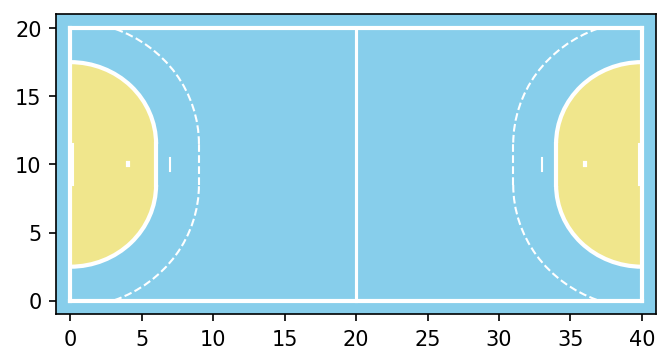

(<Figure size 600x300 with 1 Axes>, <AxesSubplot:>)

In [2]:
plot_handball_pitch(0, 40, 0, 20, (4, 2), show=True)

In [3]:
pos_file = Path("data/eigd/handball/positions/48dcd3_00-06-00.h5")
pos_dict, num_frames = read_pos_dict(pos_file)

# select only a temporal subset based on indices (frame number)
subset_frames = (1000,1300)
pos_dict = {k: v[subset_frames[0]:subset_frames[1], ::] for k, v in pos_dict.items()}
num_frames=subset_frames[1] - subset_frames[0]
print({ f"{k} {v.shape}"for k, v in  pos_dict.items()})

pos_sets_scatter_kwargs = {
    "balls": {"c": "k", "s": 100, "zorder": 1000},
    "team_a": {"c": "r", "s": 200, "zorder": 100},
    "team_b": {"c": "b", "s": 200, "zorder": 100},
}
anim_plotter = AnimPlotterHandball(pos_dict, num_frames, pos_sets_scatter_kwargs, figsize=(6,3), )
anim = anim_plotter.animate(fps=30.)
anim

{'team_a: (9000, 16, 2)', 'team_b: (9000, 15, 2)', 'balls: (9000, 3, 3)'}
num_frames: 9000
{'team_a (300, 16, 2)', 'balls (300, 3, 3)', 'team_b (300, 15, 2)'}
